#  Pure Prompt-on-Demand Road Damage & Infrastructure Segmentation
### Murni SAM 3.1 / SAM 3 (Promptable Concept Segmentation) — Tanpa YOLO, Tanpa Koordinat Manual

Notebook ini melakukan segmentasi permukaan jalan & infrastruktur (**Pothole, Manhole, Traffic Sign, Road Crack**, atau kelas apa pun) secara **100% Pure SAM Prompt-on-Demand**, murni menggunakan kemampuan SAM tanpa detektor eksternal (YOLO/YOLO-World).

---

###  Apa yang Baru di Versi Ini?

1. **Benar-benar *Loosely Coupled* per Gambar**
   Deteksi tidak lagi bergantung pada koordinat `box`/`point` yang di-hardcode untuk satu gambar tertentu. Semua kelas didefinisikan sebagai **prompt teks** di satu dictionary (`CLASS_PROMPTS`). Ingin mengubah objek yang dideteksi? Cukup ubah teks prompt-nya — **tidak perlu mengubah kode inti sama sekali**, dan otomatis berlaku ke gambar/video apa pun.

2. **Default Model: SAM 3.1 → SAM 3 → SAM 2.1 (fallback otomatis)**
   Notebook mencoba memuat `sam3_1.pt` (SAM 3.1 — Object Multiplex, paling baru) terlebih dahulu, lalu `sam3.pt` (SAM 3), dan baru turun ke `sam2.1_t.pt` (SAM 2.1 Tiny, auto-download) jika keduanya tidak tersedia secara lokal.

3. **Presence-Aware Detection — Tidak Dipaksakan**
   Jika sebuah kelas memang tidak ada pada gambar/frame, sistem **tidak akan menampilkan atau menghitungnya**. Tidak ada mask atau box yang dipaksakan hanya karena prompt diberikan — sesuai dengan *presence head* SAM 3 yang membedakan "apakah konsep ada" dari "di mana lokasinya".

4. **Video Sepenuhnya Bisa Dikonfigurasi**
   Satu dictionary `VIDEO_CONFIG` mengatur: model apa yang dipakai, kelas apa saja yang dideteksi, ambang confidence, jumlah frame, resolusi proses — semuanya independen dari pipeline gambar.

5. **Satu Fungsi Inti untuk Semuanya**
   `run_prompt_detection()` dipakai baik untuk gambar tunggal maupun setiap frame video — sehingga perilaku selalu konsisten (*single source of truth*, tidak ada duplikasi logika).

---


## 1. Setup Environment & Instalasi

SAM 3 / SAM 3.1 (mode prompt teks) baru tersedia di Ultralytics **>= 8.3.237** lewat kelas `SAM3SemanticPredictor`. Sel di bawah memastikan versi yang terpasang cukup baru, lalu memuat seluruh dependensi.


In [1]:
# Jalankan sekali jika versi Ultralytics Anda masih lama (opsional, aman diulang)
# !pip install -U ultralytics


In [2]:
import os
import time
from pathlib import Path

import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

import ultralytics
from ultralytics import SAM

# SAM3SemanticPredictor & SAM3VideoSemanticPredictor baru ada di Ultralytics >= 8.3.237.
# Jika belum tersedia, notebook akan otomatis turun ke mode visual (box/point) SAM 2.1.
try:
    from ultralytics.models.sam import SAM3SemanticPredictor
    _SAM3_TEXT_PROMPT_READY = True
except ImportError:
    _SAM3_TEXT_PROMPT_READY = False

print(f"Ultralytics version   : {ultralytics.__version__}")
print(f"PyTorch version       : {torch.__version__}")
print(f"CUDA Available        : {torch.cuda.is_available()}")
print(f"SAM3SemanticPredictor : {'Tersedia ' if _SAM3_TEXT_PROMPT_READY else 'TIDAK tersedia  (upgrade: pip install -U ultralytics)'}")

if torch.cuda.is_available():
    DEVICE = 0
    print(f"GPU Device Name       : {torch.cuda.get_device_name(0)}")
    print(f"VRAM Total            : {torch.cuda.get_device_properties(0).total_memory / (1024**3):.2f} GB")
else:
    DEVICE = "cpu"
    print("⚠️ CUDA tidak terdeteksi, inferensi akan berjalan di CPU (lambat untuk SAM 3/3.1).")


Ultralytics version   : 8.4.126
PyTorch version       : 2.13.0+cu130
CUDA Available        : True
SAM3SemanticPredictor : Tersedia 
GPU Device Name       : NVIDIA GeForce RTX 3080 Ti
VRAM Total            : 11.63 GB


## 2. Pemuatan Model SAM (Adaptif: SAM 3.1 → SAM 3 → SAM 2.1)

Urutan prioritas checkpoint bisa diubah bebas lewat `SAM_CHECKPOINT_PRIORITY`. Karena bobot `sam3_1.pt`/`sam3.pt` bersifat *gated* (harus diunduh manual dan disetujui lewat halaman model di Hugging Face — `facebook/sam3` / `facebook/sam3.1`), notebook ini akan:

- Memakainya **jika file tersebut sudah ada** di direktori kerja, dan mengaktifkan **mode `concept`** (deteksi berbasis prompt teks — ini mode default/yang direkomendasikan).
- Jika tidak ditemukan, otomatis turun ke `sam2.1_t.pt` (auto-download oleh Ultralytics) dengan **mode `visual`** (box/point manual, mode lama/legacy) — lihat catatan di bagian akhir notebook.

> 💡 Ingin memaksa pakai model tertentu? Cukup ubah urutan/isi `SAM_CHECKPOINT_PRIORITY` di sel berikut.


In [3]:
# Urutan prioritas checkpoint. Default: SAM 3.1 (Object Multiplex, tercepat untuk multi-objek)
# -> SAM 3 -> SAM 2.1 Tiny (fallback ringan, hemat VRAM, cocok untuk GPU kecil seperti RTX 3050).
SAM_CHECKPOINT_PRIORITY = ["sam3_1.pt", "sam3.pt", "sam2.1_t.pt"]


def resolve_sam_checkpoint(priority_list=SAM_CHECKPOINT_PRIORITY):
    """Pilih checkpoint pertama yang tersedia sesuai prioritas.

    Checkpoint keluarga SAM 3 (`sam3_1.pt`, `sam3.pt`) bersifat gated sehingga harus
    sudah ada secara lokal. Checkpoint SAM 2.1 selalu dianggap tersedia karena
    di-auto-download oleh Ultralytics saat pertama kali dipakai.
    """
    for ckpt in priority_list:
        if ckpt.startswith("sam2"):
            return ckpt
        if Path(ckpt).exists():
            return ckpt
    return priority_list[-1]


def get_sam_mode(checkpoint_name):
    """`concept` = deteksi berbasis prompt teks (SAM 3 / SAM 3.1); `visual` = box/point manual (SAM 2.1)."""
    return "concept" if checkpoint_name.startswith("sam3") else "visual"


SAM_CHECKPOINT = resolve_sam_checkpoint()
SAM_MODE = get_sam_mode(SAM_CHECKPOINT)

if SAM_MODE == "concept" and not _SAM3_TEXT_PROMPT_READY:
    print("⚠️ File SAM 3/3.1 ditemukan, tetapi `SAM3SemanticPredictor` tidak tersedia di versi Ultralytics ini.")
    print("   Jalankan `pip install -U ultralytics` lalu restart kernel. Sementara itu, turun ke mode visual SAM 2.1.")
    SAM_CHECKPOINT, SAM_MODE = "sam2.1_t.pt", "visual"

print(f"Checkpoint terpilih : {SAM_CHECKPOINT}")
print(f"Mode deteksi        : {'🅰 Prompt Teks / Concept (PCS) — direkomendasikan' if SAM_MODE == 'concept' else '🅱️ Visual Box/Point — legacy, perlu koordinat manual per gambar'}")

if SAM_MODE == "visual":
    print("\nCatatan: untuk mengaktifkan mode prompt teks, unduh `sam3_1.pt` atau `sam3.pt`")
    print("dari halaman model resmi di Hugging Face (facebook/sam3.1 atau facebook/sam3),")
    print("lalu taruh filenya di direktori kerja notebook ini dan jalankan ulang sel ini.")


Checkpoint terpilih : sam3_1.pt
Mode deteksi        : 🅰 Prompt Teks / Concept (PCS) — direkomendasikan


In [4]:
sam_predictor = None       # Instance SAM3SemanticPredictor (mode "concept")
sam_model_visual = None    # Instance SAM biasa (mode "visual")


def build_sam_backend(checkpoint, mode, conf=0.25, imgsz=1024, device=DEVICE):
    """Membangun backend SAM sesuai mode, dan menyimpannya ke variabel global.

    Dipanggil ulang otomatis apabila pipeline video meminta checkpoint yang berbeda
    dari yang sedang aktif untuk pipeline gambar.
    """
    global sam_predictor, sam_model_visual

    if mode == "concept":
        overrides = dict(
            conf=conf,
            task="segment",
            mode="predict",
            model=checkpoint,
            device=device,
            imgsz=imgsz,
            half=torch.cuda.is_available(),
            verbose=False,
            save=False,
        )
        sam_predictor = SAM3SemanticPredictor(overrides=overrides)
        sam_model_visual = None
        return sam_predictor
    else:
        sam_model_visual = SAM(checkpoint)
        sam_predictor = None
        return sam_model_visual


print(f"Memuat Pure SAM ({SAM_CHECKPOINT}, mode={SAM_MODE})...")
build_sam_backend(SAM_CHECKPOINT, SAM_MODE)
print(" Backend SAM siap dipakai untuk Prompt-on-Demand!")


Memuat Pure SAM (sam3_1.pt, mode=concept)...
WARNING ⚠️ 'half' is deprecated and will be removed in the future. Use 'quantize' instead.
 Backend SAM siap dipakai untuk Prompt-on-Demand!


## 3. Konfigurasi Kelas via Prompt Teks — Inti dari *Loose Coupling*

`CLASS_PROMPTS` adalah **satu-satunya tempat** yang perlu diubah untuk mengganti objek yang dideteksi. Setiap entri berisi:

- `text` — frasa benda (noun phrase) yang dicari SAM 3/3.1, mis. `"pothole on the road"`.
- `color` — warna overlay (BGR) untuk kelas tersebut.
- `label` — teks label yang ditampilkan di gambar/video.

Tidak ada koordinat, tidak ada nama file gambar tertentu di sini — dictionary ini berlaku untuk **gambar maupun video mana pun**, karena SAM 3/3.1 mencari konsepnya sendiri di seluruh frame.

> 💡 Menambah kelas baru = menambah satu entri di dictionary ini. Menghapus kelas = menghapus satu entri. Tidak ada bagian kode lain yang perlu disentuh.


In [5]:
CLASS_PROMPTS = {
    "pothole": {
        "text": "pothole on the road, damaged asphalt hole.",
        "label": "Pothole (Lubang Jalan)",
        "color": (0, 0, 255),        # Merah (BGR)
    },
    "manhole": {
        "text": "manhole cover, sewer cover on the road, either circle or square or rectangular, usually metal or concrete.",
        "label": "Manhole (Tutup Got)",
        "color": (0, 255, 0),        # Hijau (BGR)
    },
    "road_crack": {
        "text": "Crack lines on road",
        "label": "Road Crack (Retakan Aspal)",
        "color": (255, 0, 0),        # Biru (BGR)
    },
    "traffic_sign": {
        "text": "traffic sign",
        "label": "Traffic Sign (Rambu Jalan)",
        "color": (0, 255, 255),      # Kuning (BGR)
    },

    # "water puddle": {
    #     "text": "water inside pothole or puddle, occasionally brown colour",
    #     "label": "Water Puddle",
    #     "color": (255, 0, 255),   # Magenta
    # },
    # "fallen_leaves": {
    #     "text": "leaves on the ground",
    #     "label": "Fallen Leaves",
    #     "color": (255, 255, 0),   # Cyan
    # },
}

CONFIDENCE_THRESHOLD = 0.2  # Ambang confidence global untuk mode "concept"

print(" CLASS_PROMPTS aktif:")
for name, cfg in CLASS_PROMPTS.items():
    print(f"  • '{name}' → prompt: \"{cfg['text']}\"  |  label: {cfg['label']}")


 CLASS_PROMPTS aktif:
  • 'pothole' → prompt: "pothole on the road, damaged asphalt hole."  |  label: Pothole (Lubang Jalan)
  • 'manhole' → prompt: "manhole cover, sewer cover on the road, either circle or square or rectangular, usually metal or concrete."  |  label: Manhole (Tutup Got)
  • 'road_crack' → prompt: "Crack lines on road"  |  label: Road Crack (Retakan Aspal)
  • 'traffic_sign' → prompt: "traffic sign"  |  label: Traffic Sign (Rambu Jalan)


## 4. Fungsi Inti Deteksi & Visualisasi (Core Engine)

Semua pipeline di bawah (gambar tunggal, pengujian per kelas, unified multi-prompt, dan video) memanggil **satu fungsi yang sama**: `run_prompt_detection()`. Fungsi ini otomatis memilih backend (`concept` atau `visual`) sesuai `SAM_MODE`, dan **hanya mengembalikan kelas yang benar-benar terdeteksi** — kelas yang tidak ditemukan pada gambar akan dilewati begitu saja, tidak dipaksakan.


In [6]:
def _extract_instances(result):
    """Mengambil array mask & confidence dari satu objek Results, aman terhadap None."""
    if result is None:
        return None, None
    masks_obj = getattr(result, "masks", None)
    if masks_obj is None or getattr(masks_obj, "data", None) is None or len(masks_obj.data) == 0:
        return None, None

    masks = masks_obj.data.cpu().numpy()
    boxes_obj = getattr(result, "boxes", None)
    if boxes_obj is not None and getattr(boxes_obj, "conf", None) is not None:
        confs = boxes_obj.conf.cpu().numpy()
    else:
        confs = np.ones(len(masks), dtype=np.float32)
    return masks, confs


_SAM_TMP_FRAME_PATH = Path(".sam3_tmp_frame.jpg")


def _sam_set_image(predictor, image):
    """`set_image` pada beberapa versi Ultralytics hanya menerima path file.
    Fungsi ini mencoba ndarray langsung dulu, lalu jatuh ke file sementara bila gagal.
    """
    try:
        predictor.set_image(image)
    except Exception:
        cv2.imwrite(str(_SAM_TMP_FRAME_PATH), image)
        predictor.set_image(str(_SAM_TMP_FRAME_PATH))


def detect_concept_by_text(image_bgr, class_prompts, conf_threshold=CONFIDENCE_THRESHOLD):
    """Mode utama (default): Promptable Concept Segmentation berbasis teks (SAM 3 / SAM 3.1).

    Setiap kelas di `class_prompts` dicoba secara independen. Kelas yang memang tidak
    ada pada gambar akan otomatis kosong (berkat presence head SAM 3) dan dilewati.
    """
    _sam_set_image(sam_predictor, image_bgr)

    detections = {}
    for cls_name, cfg in class_prompts.items():
        try:
            raw = sam_predictor(text=[cfg["text"]])
        except Exception as e:
            print(f"⚠️ Prompt '{cfg['text']}' (kelas '{cls_name}') gagal dijalankan: {e}")
            continue

        result = raw[0] if isinstance(raw, (list, tuple)) else raw
        masks, confs = _extract_instances(result)
        if masks is None:
            continue  # Tidak ditemukan pada gambar ini -> dilewati, tidak dipaksakan

        keep = confs >= conf_threshold
        if not keep.any():
            continue

        detections[cls_name] = {
            "masks": masks[keep],
            "confidences": confs[keep],
            "label": cfg.get("label", cls_name),
            "color": cfg.get("color", (0, 0, 255)),
        }
    return detections


def detect_visual_by_geometry(image_bgr, class_prompts, device=DEVICE):
    """Mode fallback (legacy): box/point manual SAM 2.1. Tiap kelas butuh key
    tambahan `boxes`/`points` yang sesuai gambar yang sedang diproses (lihat
    bagian catatan legacy di akhir notebook untuk contoh lengkap).
    """
    detections = {}
    for cls_name, cfg in class_prompts.items():
        boxes = cfg.get("boxes")
        points = cfg.get("points")
        if not boxes and not points:
            continue

        res = sam_model_visual.predict(
            source=image_bgr,
            bboxes=boxes,
            points=points,
            labels=cfg.get("point_labels", [1] * len(points) if points else None),
            retina_masks=True,
            verbose=False,
            device=device,
        )[0]

        masks, confs = _extract_instances(res)
        if masks is None:
            continue

        detections[cls_name] = {
            "masks": masks,
            "confidences": confs,
            "label": cfg.get("label", cls_name),
            "color": cfg.get("color", (0, 0, 255)),
        }
    return detections


def run_prompt_detection(image_bgr, class_prompts, conf_threshold=CONFIDENCE_THRESHOLD, device=DEVICE):
    """Satu pintu masuk deteksi untuk seluruh notebook (gambar & video).

    Pemanggil tidak perlu tahu backend mana yang sedang aktif — cukup berikan
    gambar (ndarray BGR) dan dictionary kelas, fungsi ini yang menyesuaikan.
    """
    if SAM_MODE == "concept":
        return detect_concept_by_text(image_bgr, class_prompts, conf_threshold)
    return detect_visual_by_geometry(image_bgr, class_prompts, device)


print(" Fungsi 'run_prompt_detection' siap — inti loosely-coupled pipeline.")


 Fungsi 'run_prompt_detection' siap — inti loosely-coupled pipeline.


In [7]:
def render_detections(image_bgr, detections):
    """Menggambar overlay mask + kontur + label untuk kelas yang terdeteksi saja,
    dan mengembalikan catatan metrik luas area per instance.
    """
    h, w = image_bgr.shape[:2]
    overlay = image_bgr.copy()
    records = []

    for cls_name, det in detections.items():
        color = det["color"]
        label = det["label"]

        for i, mask in enumerate(det["masks"]):
            mask_bin = (mask > 0.5).astype(np.uint8)
            if mask_bin.shape != (h, w):
                mask_bin = cv2.resize(mask_bin, (w, h), interpolation=cv2.INTER_NEAREST)

            colored_mask = np.zeros_like(image_bgr, dtype=np.uint8)
            colored_mask[mask_bin == 1] = color
            overlay = cv2.addWeighted(overlay, 1.0, colored_mask, 0.45, 0)

            contours, _ = cv2.findContours(mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(overlay, contours, -1, color, 2)

            ys, xs = np.where(mask_bin == 1)
            conf_val = float(det["confidences"][i]) if i < len(det["confidences"]) else None
            if len(xs) > 0:
                tx, ty = int(xs.min()), max(20, int(ys.min()) - 8)
                conf_txt = f" {conf_val * 100:.0f}%" if conf_val is not None else ""
                cv2.putText(overlay, f"{label}{conf_txt}", (tx, ty),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.55, (255, 255, 255), 2)

            pixel_area = int(mask_bin.sum())
            records.append({
                "class": cls_name,
                "label": label,
                "instance": i + 1,
                "pixel_area": pixel_area,
                "area_percent": (pixel_area / (h * w)) * 100.0,
                "confidence": conf_val,
            })

    return overlay, records


def show_coordinate_helper(image_path, title="Panduan Koordinat Gambar"):
    """Utilitas opsional: menampilkan gambar dengan grid piksel. Hanya diperlukan
    untuk mode legacy (visual box/point); pada mode 'concept' tidak dibutuhkan lagi
    karena tidak ada koordinat yang harus ditentukan manual.
    """
    img_bgr = cv2.imread(str(image_path))
    if img_bgr is None:
        print(f" Gambar tidak ditemukan: {image_path}")
        return
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f"{title} (Lebar: {w}px, Tinggi: {h}px)", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.4, color="yellow")
    plt.xlabel("Koordinat X (piksel)")
    plt.ylabel("Koordinat Y (piksel)")
    plt.show()


print(" Fungsi 'render_detections' dan 'show_coordinate_helper' siap digunakan!")


 Fungsi 'render_detections' dan 'show_coordinate_helper' siap digunakan!


## 5. Pengujian pada Gambar — Otomatis, Tanpa Koordinat per Gambar

Loop di bawah berjalan untuk **semua gambar** di `TEST_IMAGES` dan **semua kelas** di `CLASS_PROMPTS` sekaligus — karena prompt-nya berbasis teks, tidak ada penyesuaian koordinat yang dibutuhkan per gambar baru. Kelas yang tidak ditemukan pada suatu gambar akan dilaporkan sebagai "tidak ditemukan", bukan dipaksakan muncul.


Ultralytics 8.4.126 🚀 Python-3.14.4 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 11911MiB)


/home/bondry/miky/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


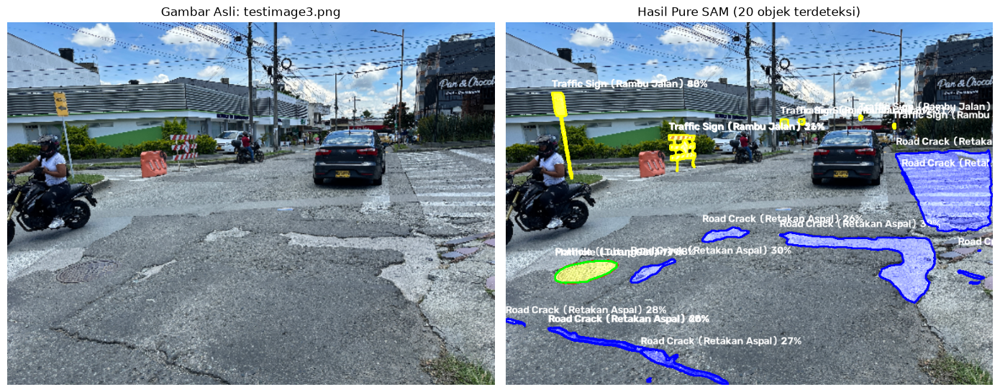

 Kelas terdeteksi pada 'testimage3.png': ['manhole', 'pothole', 'road_crack', 'traffic_sign']
    • Pothole (Lubang Jalan) #1: 2,454 px (0.56% dari gambar), confidence=0.68
    • Manhole (Tutup Got) #1: 2,384 px (0.54% dari gambar), confidence=0.77
    • Road Crack (Retakan Aspal) #1: 3,031 px (0.69% dari gambar), confidence=0.60
    • Road Crack (Retakan Aspal) #2: 8,580 px (1.95% dari gambar), confidence=0.39
    • Road Crack (Retakan Aspal) #3: 870 px (0.20% dari gambar), confidence=0.30
    • Road Crack (Retakan Aspal) #4: 174 px (0.04% dari gambar), confidence=0.29
    • Road Crack (Retakan Aspal) #5: 147 px (0.03% dari gambar), confidence=0.28
    • Road Crack (Retakan Aspal) #6: 1,569 px (0.36% dari gambar), confidence=0.27
    • Road Crack (Retakan Aspal) #7: 979 px (0.22% dari gambar), confidence=0.26
    • Road Crack (Retakan Aspal) #8: 950 px (0.22% dari gambar), confidence=0.26
    • Road Crack (Retakan Aspal) #9: 15,014 px (3.41% dari gambar), confidence=0.25
    • Road Cr

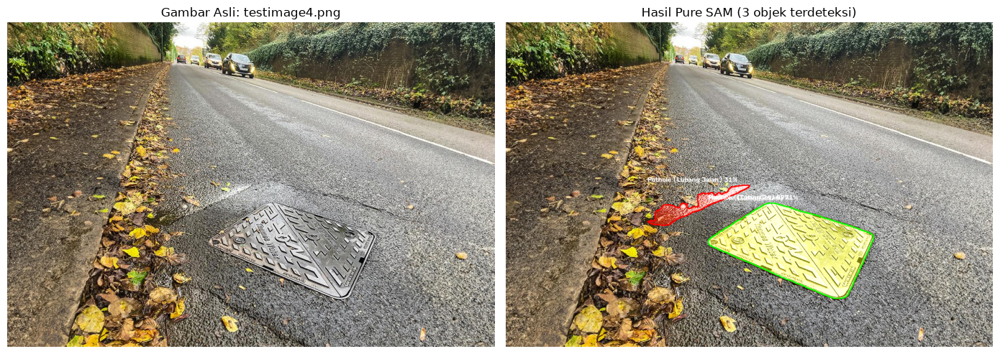

 Kelas terdeteksi pada 'testimage4.png': ['manhole', 'pothole']
➖ Tidak ditemukan (dilewati, bukan dipaksakan): ['road_crack', 'traffic_sign']
    • Pothole (Lubang Jalan) #1: 56,141 px (5.85% dari gambar), confidence=0.71
    • Pothole (Lubang Jalan) #2: 6,439 px (0.67% dari gambar), confidence=0.31
    • Manhole (Tutup Got) #1: 55,756 px (5.81% dari gambar), confidence=0.89
------------------------------------------------------------
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


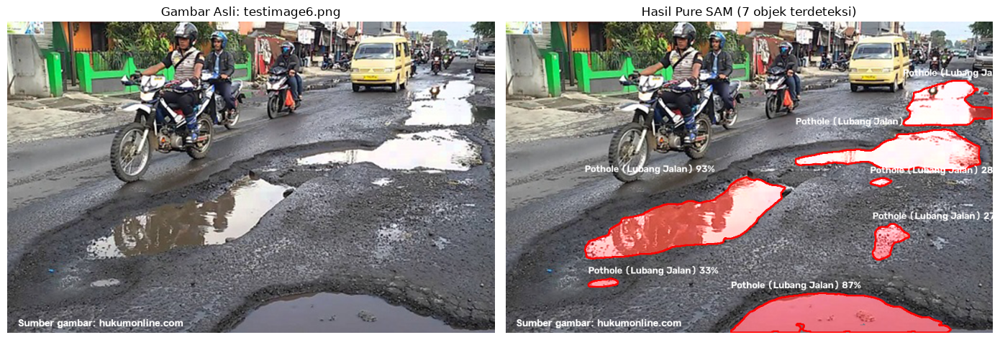

 Kelas terdeteksi pada 'testimage6.png': ['pothole']
➖ Tidak ditemukan (dilewati, bukan dipaksakan): ['manhole', 'road_crack', 'traffic_sign']
    • Pothole (Lubang Jalan) #1: 22,222 px (5.05% dari gambar), confidence=0.93
    • Pothole (Lubang Jalan) #2: 12,754 px (2.90% dari gambar), confidence=0.90
    • Pothole (Lubang Jalan) #3: 17,842 px (4.06% dari gambar), confidence=0.87
    • Pothole (Lubang Jalan) #4: 7,831 px (1.78% dari gambar), confidence=0.75
    • Pothole (Lubang Jalan) #5: 551 px (0.13% dari gambar), confidence=0.33
    • Pothole (Lubang Jalan) #6: 353 px (0.08% dari gambar), confidence=0.28
    • Pothole (Lubang Jalan) #7: 2,223 px (0.51% dari gambar), confidence=0.27
------------------------------------------------------------
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


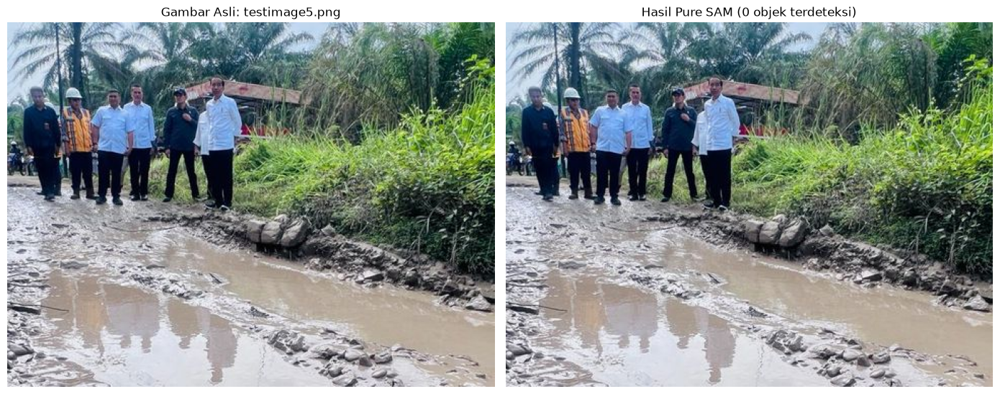

 Kelas terdeteksi pada 'testimage5.png': (tidak ada)
➖ Tidak ditemukan (dilewati, bukan dipaksakan): ['pothole', 'manhole', 'road_crack', 'traffic_sign']
------------------------------------------------------------


In [8]:
TEST_IMAGES = ["testimage3.png", "testimage4.png", "testimage6.png","testimage5.png"]
TEST_IMAGES = [p for p in TEST_IMAGES if Path(p).exists()]

if not TEST_IMAGES:
    print(" Tidak ada file pada TEST_IMAGES yang ditemukan di direktori kerja.")
    print("   Tambahkan nama file gambar Anda ke list TEST_IMAGES di atas.")

for img_path in TEST_IMAGES:
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        print(f" Gagal membaca: {img_path}")
        continue

    detections = run_prompt_detection(img_bgr, CLASS_PROMPTS)
    overlay, records = render_detections(img_bgr, detections)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Gambar Asli: {img_path}", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Hasil Pure SAM ({len(records)} objek terdeteksi)", fontsize=12)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

    found_classes = sorted(set(r["class"] for r in records))
    missing_classes = [c for c in CLASS_PROMPTS if c not in found_classes]

    print(f" Kelas terdeteksi pada '{img_path}': {found_classes or '(tidak ada)'}")
    if missing_classes:
        print(f"➖ Tidak ditemukan (dilewati, bukan dipaksakan): {missing_classes}")
    for r in records:
        conf_txt = f", confidence={r['confidence']:.2f}" if r["confidence"] is not None else ""
        print(f"    • {r['label']} #{r['instance']}: {r['pixel_area']:,} px "
              f"({r['area_percent']:.2f}% dari gambar){conf_txt}")
    print("-" * 60)


## 6. Menguji atau Mengganti Target Deteksi Secara Fleksibel

Karena semuanya berbasis prompt teks, kita bisa menguji satu kelas saja, gabungan sebagian kelas, atau bahkan kelas yang **sama sekali baru** — cukup dengan membuat dictionary prompt baru, tanpa menyentuh kode inti sama sekali.


WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


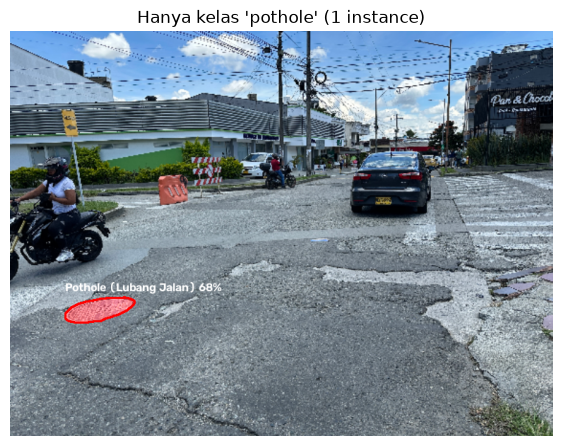

In [9]:
# Contoh A: menguji hanya SATU kelas ("pothole") pada gambar pertama yang tersedia
if TEST_IMAGES:
    sample_img = cv2.imread(TEST_IMAGES[0])
    only_pothole = {"pothole": CLASS_PROMPTS["pothole"]}

    dets = run_prompt_detection(sample_img, only_pothole)
    overlay, records = render_detections(sample_img, dets)

    plt.figure(figsize=(7, 6))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(f"Hanya kelas 'pothole' ({len(records)} instance)")
    plt.axis("off")
    plt.show()


WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


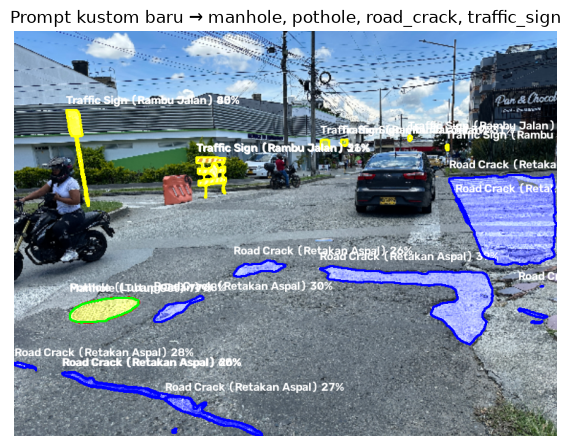

In [10]:
# Contoh B: mengganti target deteksi TOTAL BARU hanya dengan mengedit teks prompt —
# tidak ada perubahan kode, tidak ada koordinat baru yang perlu dicari.
custom_prompts = {
 
    "vegetation": {
        "text": "grass or plants growing through road cracks",
        "label": "Vegetasi Liar",
        "color": (0, 200, 0),
    },
      "pothole": {
            "text": "pothole on the road, damaged asphalt hole",
            "label": "Pothole (Lubang Jalan)",
            "color": (0, 0, 255),        # Merah (BGR)
        },
        "manhole": {
            "text": "manhole cover, sewer cover on the road",
            "label": "Manhole (Tutup Got)",
            "color": (0, 255, 0),        # Hijau (BGR)
        },
        "road_crack": {
            "text": "crack on asphalt road surface",
            "label": "Road Crack (Retakan Aspal)",
            "color": (255, 0, 0),        # Biru (BGR)
        },
        "traffic_sign": {
            "text": "traffic sign ",
            "label": "Traffic Sign (Rambu Jalan)",
            "color": (0, 255, 255),      # Kuning (BGR)
        },
    
        "water puddle": {
            "text": "water inside pothole or puddle",
            "label": "pothole",
            "color": (255, 0, 255),   # Magenta
        },
        "dry_leaves": {
            "text": "fallen leaves, usually coloured green or yellow if dry, at the ground",
            "label": "Daun Kering",
            "color": (255, 255, 0),   # Cyan
        },
}

if TEST_IMAGES:
    sample_img = cv2.imread(TEST_IMAGES[0])
    dets_custom = run_prompt_detection(sample_img, CLASS_PROMPTS)
    overlay, records = render_detections(sample_img, dets_custom)

    plt.figure(figsize=(7, 6))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    title_found = ", ".join(sorted(set(r["class"] for r in records))) or "tidak ada kelas ditemukan"
    plt.title(f"Prompt kustom baru → {title_found}")
    plt.axis("off")
    plt.show()


## 7. Unified Multi-Prompt Pipeline (Seluruh Kelas Sekaligus)

Sel ini menjalankan **seluruh `CLASS_PROMPTS`** pada satu gambar contoh, menggabungkan seluruh mask ke satu overlay, dan menyusun tabel metrik ringkas — hanya untuk kelas yang benar-benar terdeteksi.


WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


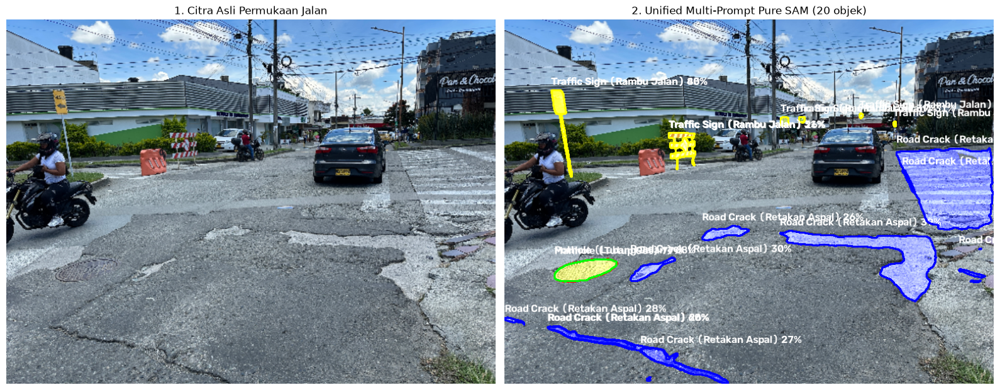

📊 Ringkasan Metrik per Kelas:
  ✅ Pothole (Lubang Jalan): 1 instance, total 0.56% dari luas gambar
  ✅ Manhole (Tutup Got): 1 instance, total 0.54% dari luas gambar
  ✅ Road Crack (Retakan Aspal): 10 instance, total 7.17% dari luas gambar
  ✅ Traffic Sign (Rambu Jalan): 8 instance, total 0.96% dari luas gambar


In [11]:
IMAGE_SAMPLE = TEST_IMAGES[0] if TEST_IMAGES else None

if IMAGE_SAMPLE:
    img_base = cv2.imread(IMAGE_SAMPLE)
    detections = run_prompt_detection(img_base, CLASS_PROMPTS)
    combined_overlay, unified_records = render_detections(img_base, detections)

    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    axes[0].imshow(cv2.cvtColor(img_base, cv2.COLOR_BGR2RGB))
    axes[0].set_title("1. Citra Asli Permukaan Jalan", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(combined_overlay, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"2. Unified Multi-Prompt Pure SAM ({len(unified_records)} objek)", fontsize=12)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

    print("📊 Ringkasan Metrik per Kelas:")
    for cls_name in CLASS_PROMPTS:
        cls_records = [r for r in unified_records if r["class"] == cls_name]
        if not cls_records:
            print(f"  ➖ {CLASS_PROMPTS[cls_name]['label']}: tidak ditemukan pada gambar ini")
            continue
        total_area_pct = sum(r["area_percent"] for r in cls_records)
        print(f"  ✅ {CLASS_PROMPTS[cls_name]['label']}: {len(cls_records)} instance, "
              f"total {total_area_pct:.2f}% dari luas gambar")
else:
    print("⚠️ Tidak ada gambar contoh di TEST_IMAGES untuk dijalankan.")


## 8. Bagian Video — Model, Kelas, dan Threshold Sepenuhnya Bisa Diatur

`VIDEO_CONFIG` adalah satu tempat untuk mengatur seluruh perilaku pipeline video:

| Key | Fungsi |
|---|---|
| `model_checkpoint` | Model SAM yang dipakai khusus untuk video. `None` = pakai model gambar yang sudah dimuat. Bisa diisi model lain (mis. `"sam2.1_t.pt"`) agar video diproses lebih cepat/hemat VRAM. |
| `classes` | Dictionary kelas (format sama seperti `CLASS_PROMPTS`) — bisa subset, superset, atau sepenuhnya berbeda dari yang dipakai di pipeline gambar. |
| `conf_threshold` | Ambang confidence khusus video. |
| `max_frames` | `None` = proses seluruh video; isi angka untuk uji cepat. |
| `skip_frames` | 1 = tiap frame diproses, 2 = tiap 2 frame (lebih cepat). |
| `resize_dim` | Resolusi pemrosesan (mengatur trade-off kecepatan vs kualitas). |

Kelas yang tidak muncul pada suatu frame otomatis dilewati di frame tersebut (bukan dipaksakan) — HUD hanya menampilkan hitungan `0`/`-` untuk kelas yang memang absen di frame itu.


In [12]:
VIDEO_CONFIG = {
    "input_path": "testvideo1.mp4",
    "output_path": "hasil_video_pure_sam.mp4",
    "model_checkpoint": None,     # None = pakai backend yang sama dengan pipeline gambar
    "classes": CLASS_PROMPTS,     # Ganti dengan subset/kelas lain sesuai kebutuhan, mis:
                                   # {"pothole": CLASS_PROMPTS["pothole"], "road_crack": CLASS_PROMPTS["road_crack"]}
    "conf_threshold": 0.25,
    "max_frames": 300,             # Ganti None untuk memproses seluruh video
    "sam_imgsz": 560,
    # "sam_imgsz": 448,
    "skip_frames": 1,
    # "resize_dim": (1280, 720),
    "resize_dim": (640, 480),
    # "resize_dim": (640, 360),
}

print("✅ VIDEO_CONFIG aktif:")
print(f"  • Model    : {VIDEO_CONFIG['model_checkpoint'] or f'(ikut pipeline gambar: {SAM_CHECKPOINT})'}")
print(f"  • Kelas    : {list(VIDEO_CONFIG['classes'].keys())}")
print(f"  • Threshold: {VIDEO_CONFIG['conf_threshold']}")
print(f"  • Frame    : {VIDEO_CONFIG['max_frames'] or 'seluruh video'} (skip={VIDEO_CONFIG['skip_frames']})")
print(f"  • Resize   : {VIDEO_CONFIG['resize_dim']}")

✅ VIDEO_CONFIG aktif:
  • Model    : (ikut pipeline gambar: sam3_1.pt)
  • Kelas    : ['pothole', 'manhole', 'road_crack', 'traffic_sign']
  • Threshold: 0.25
  • Frame    : 300 (skip=1)
  • Resize   : (640, 480)


## 9. Video Processing Engine

Menggunakan fungsi inti `run_prompt_detection()` yang sama dengan pipeline gambar — sehingga logika deteksi selalu konsisten antara gambar dan video. HUD menampilkan FPS real-time, model yang aktif, dan hitungan per kelas (dinamis, mengikuti isi `VIDEO_CONFIG["classes"]`).


In [13]:
def ensure_backend_for_video(video_config):
    """Memuat ulang backend SAM jika VIDEO_CONFIG meminta checkpoint berbeda
    dari yang sedang aktif untuk pipeline gambar.
    """
    global SAM_CHECKPOINT, SAM_MODE

    target_ckpt = video_config.get("model_checkpoint") or SAM_CHECKPOINT
    target_imgsz = video_config.get("sam_imgsz", 560)
    target_mode = get_sam_mode(target_ckpt)

    backend_missing = (
        (target_mode == "concept" and sam_predictor is None)
        or (target_mode == "visual" and sam_model_visual is None)
    )

    if target_ckpt != SAM_CHECKPOINT or backend_missing:
        print(f"🔁 Memuat backend SAM untuk video: {target_ckpt} (mode={target_mode})")
        build_sam_backend(target_ckpt, target_mode, conf=video_config.get("conf_threshold", CONFIDENCE_THRESHOLD), imgsz=target_imgsz)
        SAM_CHECKPOINT, SAM_MODE = target_ckpt, target_mode

    return target_mode


def process_video_pure_sam(video_config):
    """Memproses video menggunakan Pure SAM Prompt-on-Demand berbasis konfigurasi.

    Kelas yang tidak ditemukan pada suatu frame otomatis tidak dihitung/digambar
    pada frame tersebut (mengikuti perilaku `run_prompt_detection`).
    """
    mode = ensure_backend_for_video(video_config)

    video_path = video_config["input_path"]
    output_path = video_config["output_path"]
    class_prompts = video_config["classes"]
    conf_th = video_config.get("conf_threshold", CONFIDENCE_THRESHOLD)
    max_frames = video_config.get("max_frames")
    skip_frames = max(1, video_config.get("skip_frames", 1))
    resize_dim = video_config.get("resize_dim")

    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        raise IOError(f"Video tidak ditemukan: {video_path}")

    orig_w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    orig_h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps_in = cap.get(cv2.CAP_PROP_FPS) or 30.0
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    out_w, out_h = resize_dim if resize_dim else (orig_w, orig_h)

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(str(output_path), fourcc, fps_in / skip_frames, (out_w, out_h))

    print("=" * 60)
    print(f"🎬 Video   : {video_path}")
    print(f"Model      : {SAM_CHECKPOINT} (mode={mode})")
    print(f"Kelas      : {list(class_prompts.keys())}")
    print(f"Resolusi   : {orig_w}x{orig_h} → {out_w}x{out_h} @ {fps_in:.1f} FPS")
    print(f"Batas frame: {max_frames if max_frames else f'seluruh video ({total_frames})'}")
    print("=" * 60)

    frame_idx, processed = 0, 0
    start_time = time.time()
    temporal_log = []
    sample_frames = []
    gallery_stride = max(1, (max_frames or total_frames) // 5)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frame_idx % skip_frames != 0:
            frame_idx += 1
            continue
        if max_frames and processed >= max_frames:
            break

        frame_proc = cv2.resize(frame, resize_dim) if resize_dim else frame

        t0 = time.time()
        detections = run_prompt_detection(frame_proc, class_prompts, conf_threshold=conf_th)
        annotated, records = render_detections(frame_proc, detections)
        fps_now = 1.0 / max(1e-5, time.time() - t0)

        counts = {cls: 0 for cls in class_prompts}
        total_damage_px = 0
        for r in records:
            counts[r["class"]] += 1
            total_damage_px += r["pixel_area"]

        # --- HUD dashboard ---
        n_lines = len(class_prompts)
        hud_bg = annotated.copy()
        cv2.rectangle(hud_bg, (10, 10), (450, 78 + n_lines * 22), (20, 20, 20), -1)
        annotated = cv2.addWeighted(annotated, 0.25, hud_bg, 0.75, 0)

        cv2.putText(annotated, f"Pure SAM Video | Frame {frame_idx}/{total_frames}", (20, 32),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, (255, 255, 255), 2)
        cv2.putText(annotated, f"{fps_now:.1f} FPS | {frame_idx / fps_in:.2f}s | Model: {SAM_CHECKPOINT}",
                    (20, 54), cv2.FONT_HERSHEY_SIMPLEX, 0.48, (0, 255, 200), 1)

        y = 78
        for cls_name, cfg in class_prompts.items():
            color = cfg.get("color", (255, 255, 255))
            label = cfg.get("label", cls_name)
            cnt = counts.get(cls_name, 0)
            cv2.circle(annotated, (28, y - 4), 6, color, -1)
            status = str(cnt) if cnt > 0 else "-"
            cv2.putText(annotated, f"{label}: {status}", (42, y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.48, (255, 255, 255), 1)
            y += 22

        writer.write(annotated)

        temporal_log.append({
            "frame": frame_idx,
            "time_sec": frame_idx / fps_in,
            "counts": counts,
            "damage_pixels": total_damage_px,
            "damage_pct": (total_damage_px / (out_w * out_h)) * 100.0,
        })

        if processed % gallery_stride == 0:
            sample_frames.append((frame_idx, annotated.copy()))

        processed += 1
        frame_idx += 1

        if processed % 15 == 0:
            elapsed = time.time() - start_time
            print(f"  ⚡ {processed}/{max_frames or total_frames} frame diproses | "
                  f"rata-rata {processed / elapsed:.1f} FPS")

    cap.release()
    writer.release()

    total_time = time.time() - start_time
    print("=" * 60)
    print("✅ PEMROSESAN VIDEO SELESAI!")
    print(f"Total frame diproses : {processed}")
    print(f"Total waktu          : {total_time:.2f} detik ({processed / max(total_time, 1e-6):.1f} FPS rata-rata)")
    print(f"File hasil disimpan  : {output_path}")
    print("=" * 60)

    return temporal_log, sample_frames


print("✅ Fungsi 'process_video_pure_sam' siap dijalankan.")


✅ Fungsi 'process_video_pure_sam' siap dijalankan.


## 10. Eksekusi Video Sesuai `VIDEO_CONFIG`


🎬 Video   : testvideo1.mp4
Model      : sam3_1.pt (mode=concept)
Kelas      : ['pothole', 'manhole', 'road_crack', 'traffic_sign']
Resolusi   : 1920x1080 → 640x480 @ 30.0 FPS
Batas frame: 300
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must

WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]
  ⚡ 45/300 frame diproses | rata-rata 1.9 FPS
WARNING ⚠️ imgsz=[

/tmp/ipykernel_2702240/3338177382.py:14: UserWarning: Glyph 128248 (\N{CAMERA WITH FLASH}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/bondry/miky/.venv/lib/python3.14/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 128248 (\N{CAMERA WITH FLASH}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


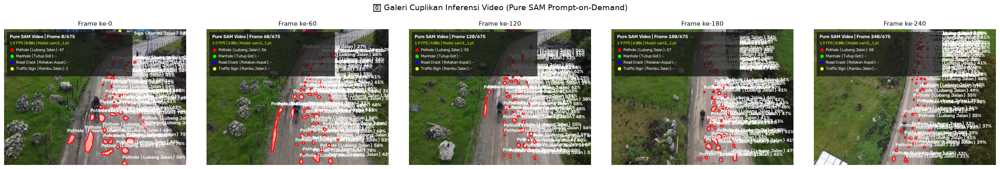

In [14]:
if Path(VIDEO_CONFIG["input_path"]).exists():
    damage_log, sample_frames = process_video_pure_sam(VIDEO_CONFIG)

    if sample_frames:
        num_samples = len(sample_frames)
        fig, axes = plt.subplots(1, num_samples, figsize=(5 * num_samples, 4))
        if num_samples == 1:
            axes = [axes]
        for ax, (f_idx, f_img) in zip(axes, sample_frames):
            ax.imshow(cv2.cvtColor(f_img, cv2.COLOR_BGR2RGB))
            ax.set_title(f"Frame ke-{f_idx}", fontsize=11)
            ax.axis("off")
        plt.suptitle("📸 Galeri Cuplikan Inferensi Video (Pure SAM Prompt-on-Demand)", fontsize=14, y=1.03)
        plt.tight_layout()
        plt.show()
else:
    damage_log, sample_frames = [], []
    print(f"⚠️ File video '{VIDEO_CONFIG['input_path']}' tidak ditemukan di direktori kerja.")
    print("   Letakkan file video Anda lalu jalankan ulang sel ini.")


## 11. Analisis Metrik Temporal Kerusakan Jalan

Grafik ini sepenuhnya mengikuti kelas yang didefinisikan di `VIDEO_CONFIG["classes"]` — tidak ada kelas yang di-hardcode di sini, sehingga tetap relevan berapa pun jumlah/nama kelas yang Anda pakai.


/tmp/ipykernel_2702240/3760520020.py:26: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2702240/3760520020.py:27: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.savefig("grafik_analisis_temporal_jalan.png", dpi=300)
/home/bondry/miky/.venv/lib/python3.14/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


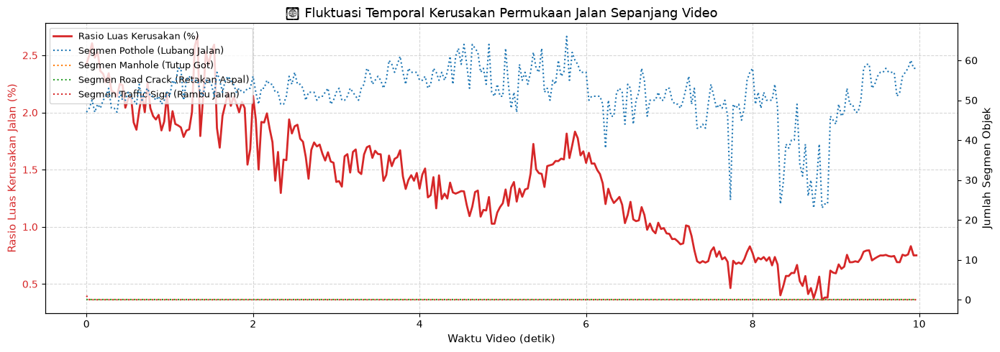

📊 KESIMPULAN ANALISIS TEMPORAL:
  • Titik kerusakan tertinggi : detik ke-1.33 (2.67% area)
  • Rata-rata rasio kerusakan : 1.35%
  • Pothole (Lubang Jalan): 15503 total kemunculan segmen, muncul di 300/300 frame
  • Manhole (Tutup Got): 0 total kemunculan segmen, muncul di 0/300 frame
  • Road Crack (Retakan Aspal): 0 total kemunculan segmen, muncul di 0/300 frame
  • Traffic Sign (Rambu Jalan): 1 total kemunculan segmen, muncul di 1/300 frame


In [15]:
if damage_log:
    times = [d["time_sec"] for d in damage_log]
    dmg_pcts = [d["damage_pct"] for d in damage_log]
    class_names = list(VIDEO_CONFIG["classes"].keys())

    fig, ax1 = plt.subplots(figsize=(14, 5))
    ax1.set_xlabel("Waktu Video (detik)", fontsize=11)
    ax1.set_ylabel("Rasio Luas Kerusakan Jalan (%)", color="tab:red", fontsize=11)
    ax1.plot(times, dmg_pcts, color="tab:red", linewidth=2, label="Rasio Luas Kerusakan (%)")
    ax1.tick_params(axis="y", labelcolor="tab:red")
    ax1.grid(True, linestyle="--", alpha=0.5)

    ax2 = ax1.twinx()
    ax2.set_ylabel("Jumlah Segmen Objek", fontsize=11)
    palette = plt.cm.tab10.colors
    for i, cls_name in enumerate(class_names):
        counts = [d["counts"].get(cls_name, 0) for d in damage_log]
        label = VIDEO_CONFIG["classes"][cls_name].get("label", cls_name)
        ax2.plot(times, counts, linestyle=":", color=palette[i % len(palette)], label=f"Segmen {label}")

    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper left", fontsize=9)

    plt.title("📈 Fluktuasi Temporal Kerusakan Permukaan Jalan Sepanjang Video", fontsize=13)
    plt.tight_layout()
    plt.savefig("grafik_analisis_temporal_jalan.png", dpi=300)
    plt.show()

    max_idx = int(np.argmax(dmg_pcts))
    print("=" * 60)
    print("📊 KESIMPULAN ANALISIS TEMPORAL:")
    print(f"  • Titik kerusakan tertinggi : detik ke-{times[max_idx]:.2f} ({dmg_pcts[max_idx]:.2f}% area)")
    print(f"  • Rata-rata rasio kerusakan : {np.mean(dmg_pcts):.2f}%")
    for cls_name in class_names:
        label = VIDEO_CONFIG["classes"][cls_name].get("label", cls_name)
        total_cnt = sum(d["counts"].get(cls_name, 0) for d in damage_log)
        frames_present = sum(1 for d in damage_log if d["counts"].get(cls_name, 0) > 0)
        print(f"  • {label}: {total_cnt} total kemunculan segmen, muncul di {frames_present}/{len(damage_log)} frame")
    print("=" * 60)
else:
    print("Tidak ada data temporal (video belum diproses atau tidak ada frame yang terbaca).")


## 12. Catatan: Mode Legacy (Visual Box/Point) & Troubleshooting

Bagian ini hanya relevan jika notebook jatuh ke **mode `visual`** (SAM 2.1) karena `sam3_1.pt`/`sam3.pt` belum tersedia.

### Mengaktifkan mode prompt teks (direkomendasikan)
1. Minta akses & unduh bobot di halaman model resmi Hugging Face (`facebook/sam3.1` atau `facebook/sam3`).
2. Taruh file `sam3_1.pt` (atau `sam3.pt`) di direktori kerja notebook ini.
3. Pastikan `ultralytics >= 8.3.237`: `pip install -U ultralytics`.
4. Jalankan ulang notebook dari Bagian 2.

### Menggunakan mode legacy (box/point manual) jika belum punya bobot SAM 3/3.1
Format konfigurasi legacy sama seperti `CLASS_PROMPTS`, tetapi menggunakan `boxes`/`points` alih-alih `text` — dan **harus disesuaikan ulang setiap ganti gambar**, karena inilah yang coba dihindari oleh mode `concept`:

```python
LEGACY_VISUAL_PROMPTS = {
    "pothole": {
        "label": "Pothole (Lubang Jalan)",
        "color": (0, 0, 255),
        "boxes": [[424, 323, 720, 454]],   # Koordinat spesifik untuk SATU gambar tertentu
        "points": [[560, 385]],
        "point_labels": [1],
    },
}

# Gunakan show_coordinate_helper("nama_gambar.png") untuk membantu menentukan koordinat.
# detections = run_prompt_detection(img_bgr, LEGACY_VISUAL_PROMPTS)  # otomatis pakai backend visual
```

### Tips VRAM
- `sam2.1_t.pt` (Tiny) — paling ringan, cocok GPU 4 GB seperti RTX 3050.
- `sam3.pt` / `sam3_1.pt` — jauh lebih besar (≈3.3–3.5 GB model, butuh VRAM signifikan lebih banyak saat inferensi). Jika VRAM terbatas, turunkan `imgsz` pada `build_sam_backend`, kecilkan `resize_dim` pada `VIDEO_CONFIG`, atau gunakan `sam2.1_t.pt` khusus untuk video (`VIDEO_CONFIG["model_checkpoint"] = "sam2.1_t.pt"`) sambil tetap memakai SAM 3.1 untuk gambar.


WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


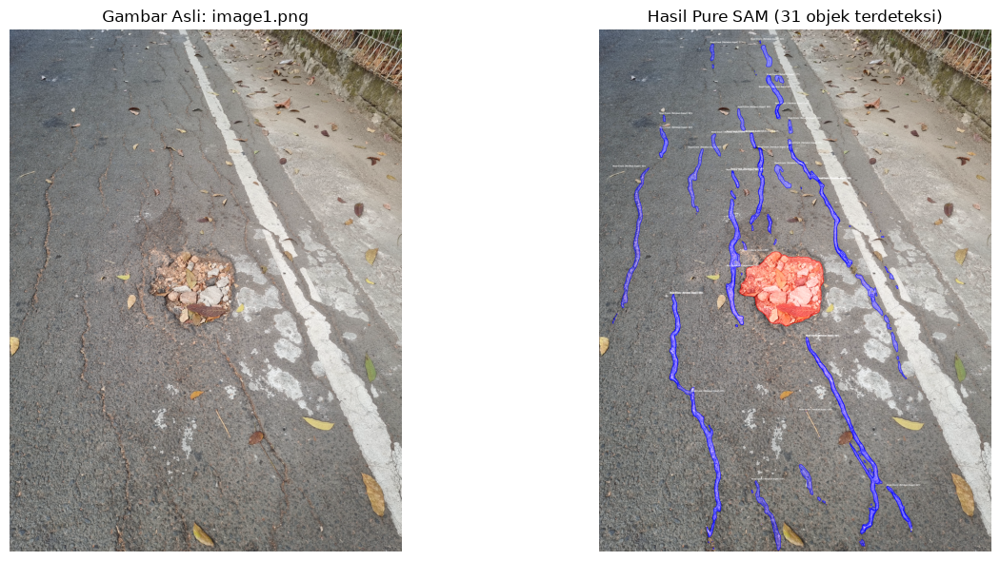

 Kelas terdeteksi pada 'image1.png': ['pothole', 'road_crack']
➖ Tidak ditemukan (dilewati, bukan dipaksakan): ['manhole', 'traffic_sign']
    • Pothole (Lubang Jalan) #1: 257,595 px (2.15% dari gambar), confidence=0.88
    • Road Crack (Retakan Aspal) #1: 31,105 px (0.26% dari gambar), confidence=0.62
    • Road Crack (Retakan Aspal) #2: 12,590 px (0.10% dari gambar), confidence=0.61
    • Road Crack (Retakan Aspal) #3: 52,031 px (0.43% dari gambar), confidence=0.56
    • Road Crack (Retakan Aspal) #4: 20,876 px (0.17% dari gambar), confidence=0.56
    • Road Crack (Retakan Aspal) #5: 64,001 px (0.53% dari gambar), confidence=0.50
    • Road Crack (Retakan Aspal) #6: 36,127 px (0.30% dari gambar), confidence=0.49
    • Road Crack (Retakan Aspal) #7: 16,917 px (0.14% dari gambar), confidence=0.43
    • Road Crack (Retakan Aspal) #8: 37,551 px (0.31% dari gambar), confidence=0.40
    • Road Crack (Retakan Aspal) #9: 5,665 px (0.05% dari gambar), confidence=0.39
    • Road Crack (Retakan

In [16]:
TEST_IMAGES = ["image1.png"]
TEST_IMAGES = [p for p in TEST_IMAGES if Path(p).exists()]

if not TEST_IMAGES:
    print(" Tidak ada file pada TEST_IMAGES yang ditemukan di direktori kerja.")
    print("   Tambahkan nama file gambar Anda ke list TEST_IMAGES di atas.")

for img_path in TEST_IMAGES:
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        print(f" Gagal membaca: {img_path}")
        continue

    detections = run_prompt_detection(img_bgr, CLASS_PROMPTS)
    overlay, records = render_detections(img_bgr, detections)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Gambar Asli: {img_path}", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Hasil Pure SAM ({len(records)} objek terdeteksi)", fontsize=12)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

    found_classes = sorted(set(r["class"] for r in records))
    missing_classes = [c for c in CLASS_PROMPTS if c not in found_classes]

    print(f" Kelas terdeteksi pada '{img_path}': {found_classes or '(tidak ada)'}")
    if missing_classes:
        print(f"➖ Tidak ditemukan (dilewati, bukan dipaksakan): {missing_classes}")
    for r in records:
        conf_txt = f", confidence={r['confidence']:.2f}" if r["confidence"] is not None else ""
        print(f"    • {r['label']} #{r['instance']}: {r['pixel_area']:,} px "
              f"({r['area_percent']:.2f}% dari gambar){conf_txt}")
    print("-" * 60)


WARNING ⚠️ imgsz=[1024] must be multiple of max stride 14, updating to [1036]


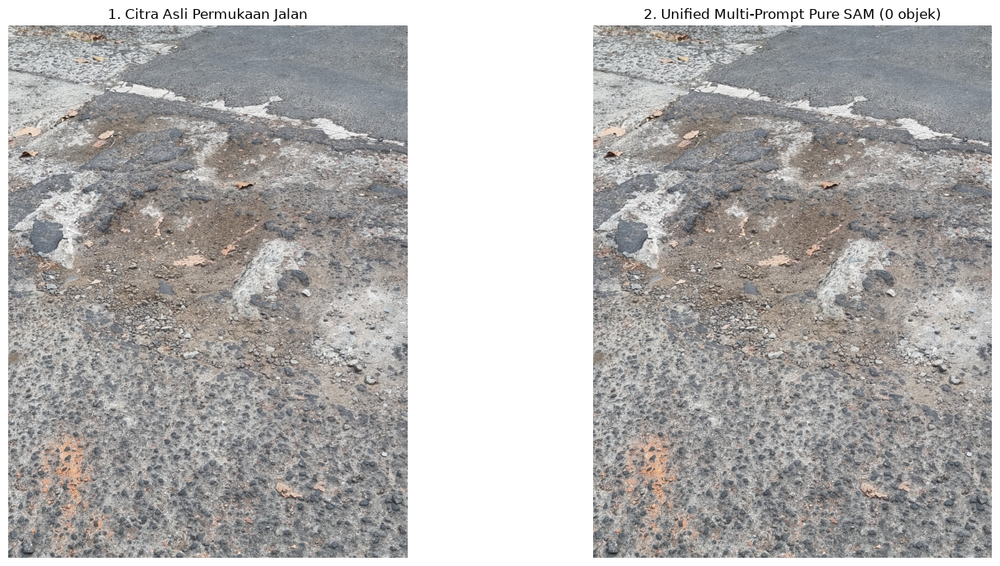

📊 Ringkasan Metrik per Kelas:
  ➖ Pothole (Lubang Jalan): tidak ditemukan pada gambar ini
  ➖ Manhole (Tutup Got): tidak ditemukan pada gambar ini
  ➖ Road Crack (Retakan Aspal): tidak ditemukan pada gambar ini
  ➖ Traffic Sign (Rambu Jalan): tidak ditemukan pada gambar ini


In [17]:
IMAGE_SAMPLE = "hard_image.png" if TEST_IMAGES else None

if IMAGE_SAMPLE:
    img_base = cv2.imread(IMAGE_SAMPLE)
    detections = run_prompt_detection(img_base, CLASS_PROMPTS)
    combined_overlay, unified_records = render_detections(img_base, detections)

    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    axes[0].imshow(cv2.cvtColor(img_base, cv2.COLOR_BGR2RGB))
    axes[0].set_title("1. Citra Asli Permukaan Jalan", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(combined_overlay, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"2. Unified Multi-Prompt Pure SAM ({len(unified_records)} objek)", fontsize=12)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

    print("📊 Ringkasan Metrik per Kelas:")
    for cls_name in CLASS_PROMPTS:
        cls_records = [r for r in unified_records if r["class"] == cls_name]
        if not cls_records:
            print(f"  ➖ {CLASS_PROMPTS[cls_name]['label']}: tidak ditemukan pada gambar ini")
            continue
        total_area_pct = sum(r["area_percent"] for r in cls_records)
        print(f"  ✅ {CLASS_PROMPTS[cls_name]['label']}: {len(cls_records)} instance, "
              f"total {total_area_pct:.2f}% dari luas gambar")
else:
    print("⚠️ Tidak ada gambar contoh di TEST_IMAGES untuk dijalankan.")
